### Basic information about stores

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from dtaidistance import dtw
from itertools import combinations

In [2]:
store_df = pd.read_csv('/home/nnemati/forcasting_time_series/kaggle_chalenge/sale_forcasting_chalenge/data/raw/stores.csv')
train_df = pd.read_csv('/home/nnemati/forcasting_time_series/kaggle_chalenge/sale_forcasting_chalenge/data/raw/train.csv')

In [3]:
train_df['date'] = pd.to_datetime(train_df['date'], format= "%Y-%m-%d")

In [4]:
train_df['agg_sales'] = train_df[['date', 'store_nbr', 'sales']].groupby(['date', 'store_nbr']).transform('sum')

In [5]:
store_df

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [6]:
cities = store_df['city'].drop_duplicates().values

In [7]:
cities

array(['Quito', 'Santo Domingo', 'Cayambe', 'Latacunga', 'Riobamba',
       'Ibarra', 'Guaranda', 'Puyo', 'Ambato', 'Guayaquil', 'Salinas',
       'Daule', 'Babahoyo', 'Quevedo', 'Playas', 'Libertad', 'Cuenca',
       'Loja', 'Machala', 'Esmeraldas', 'Manta', 'El Carmen'],
      dtype=object)

In [8]:
city_store_count = store_df.groupby('city')['store_nbr'].count()

In [9]:
print("Number of stores in each city:")
print(city_store_count)
print("\n")

Number of stores in each city:
city
Ambato            2
Babahoyo          1
Cayambe           1
Cuenca            3
Daule             1
El Carmen         1
Esmeraldas        1
Guaranda          1
Guayaquil         8
Ibarra            1
Latacunga         2
Libertad          1
Loja              1
Machala           2
Manta             2
Playas            1
Puyo              1
Quevedo           1
Quito            18
Riobamba          1
Salinas           1
Santo Domingo     3
Name: store_nbr, dtype: int64




City: Ambato
Store Numbers: [23, 50]


store_number: 23


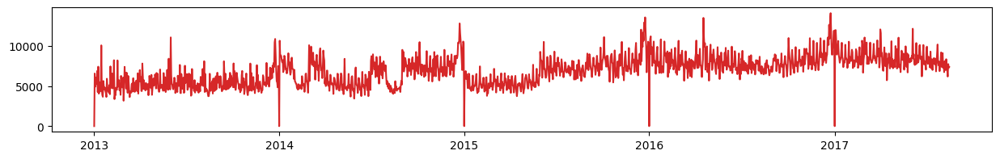

store_number: 50


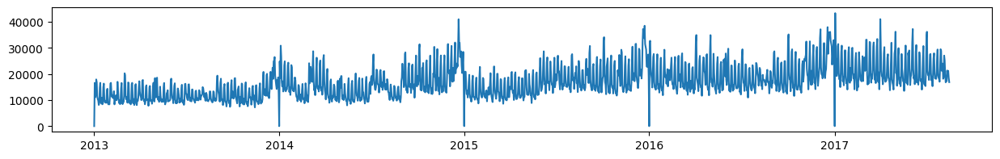

City: Babahoyo
Store Numbers: [31]


store_number: 31


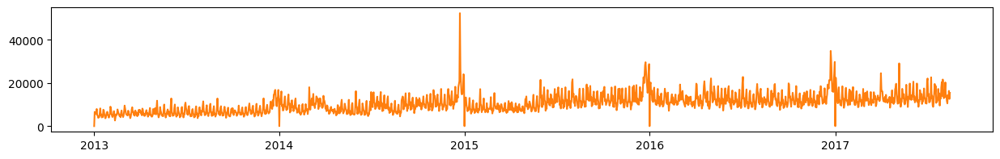

City: Cayambe
Store Numbers: [11]


store_number: 11


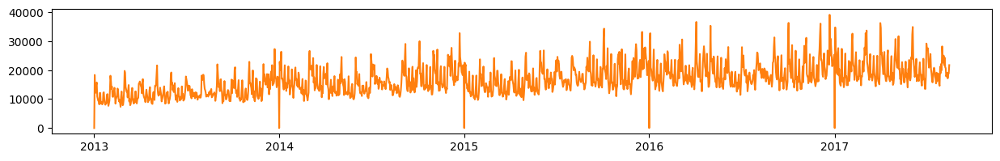

City: Cuenca
Store Numbers: [37, 39, 42]


store_number: 37


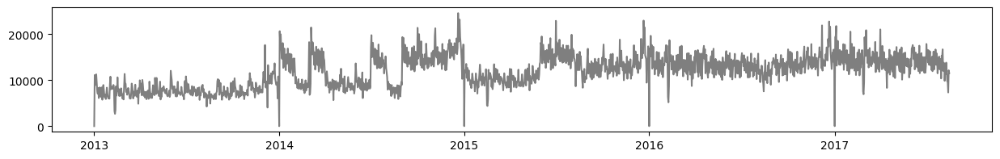

store_number: 39


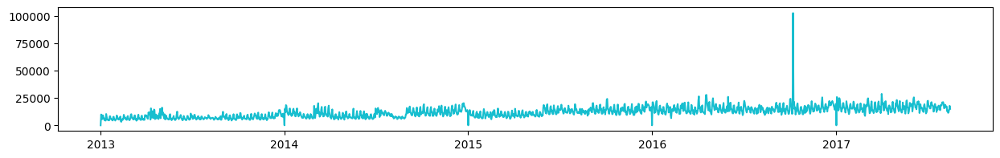

store_number: 42


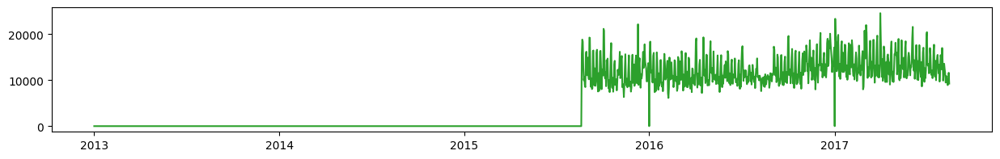

City: Daule
Store Numbers: [27]


store_number: 27


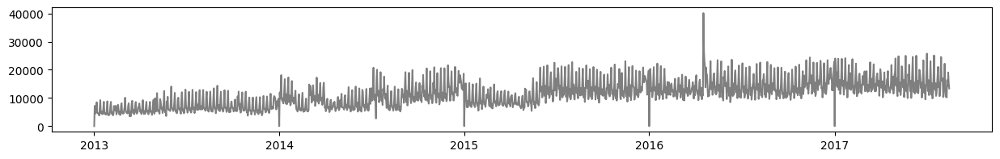

City: El Carmen
Store Numbers: [54]


store_number: 54


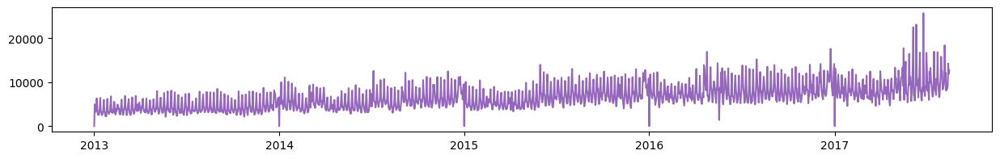

City: Esmeraldas
Store Numbers: [43]


store_number: 43


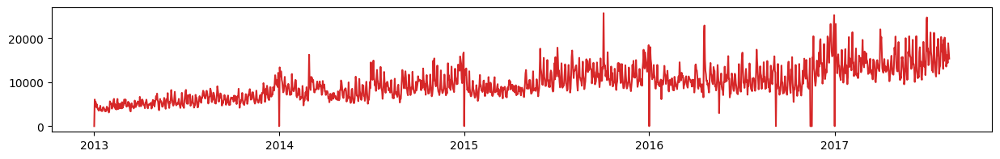

City: Guaranda
Store Numbers: [19]


store_number: 19


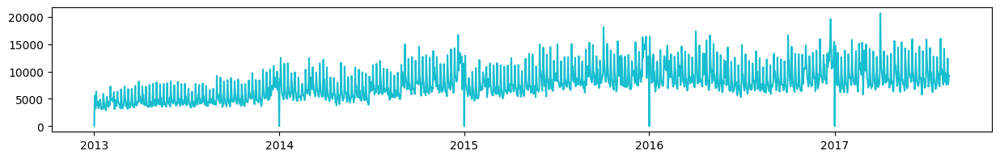

City: Guayaquil
Store Numbers: [24, 26, 28, 29, 30, 32, 34, 51]


store_number: 24


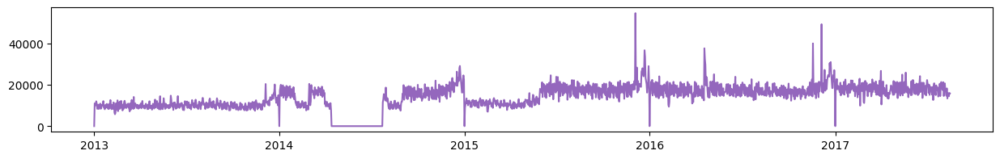

store_number: 26


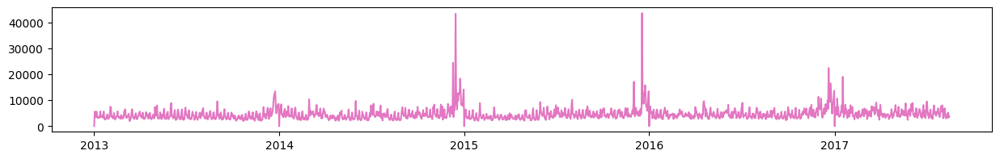

store_number: 28


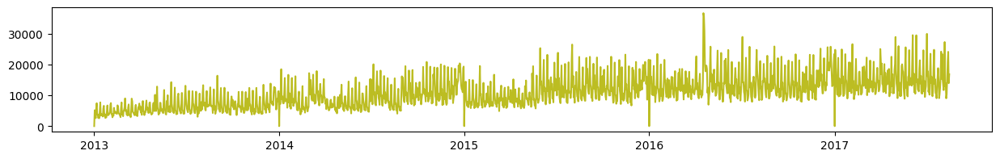

store_number: 29


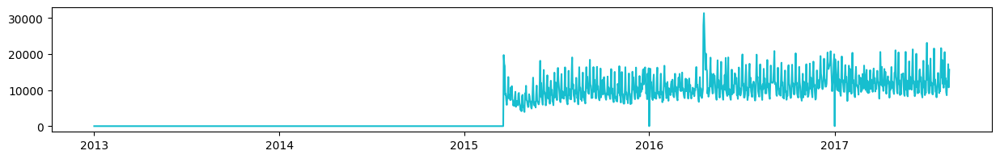

store_number: 30


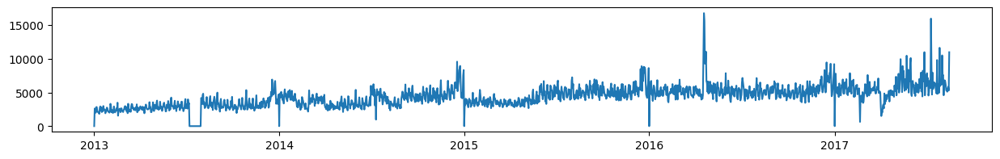

store_number: 32


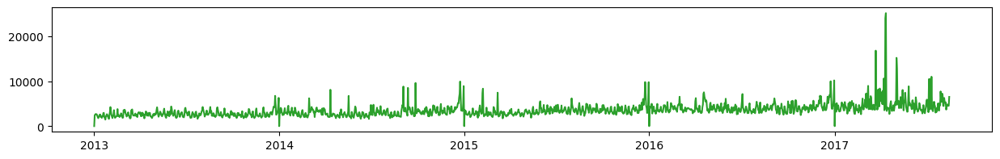

store_number: 34


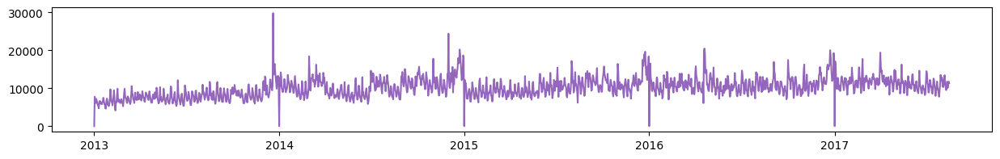

store_number: 51


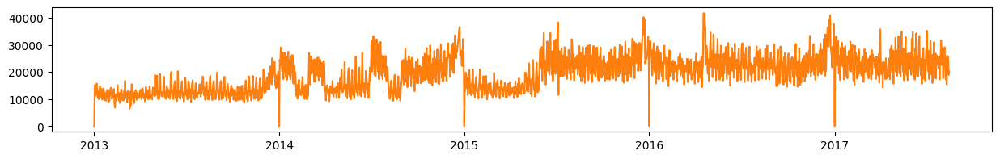

City: Ibarra
Store Numbers: [15]


store_number: 15


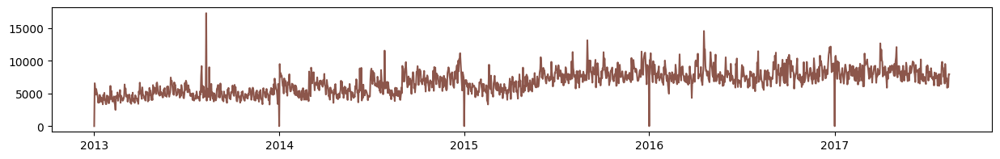

City: Latacunga
Store Numbers: [12, 13]


store_number: 12


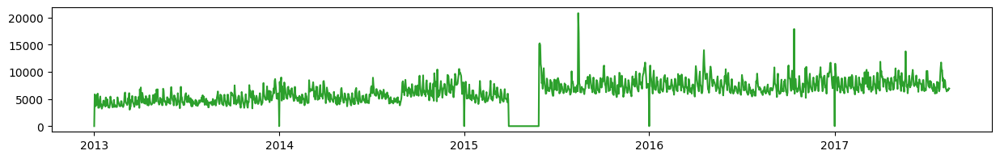

store_number: 13


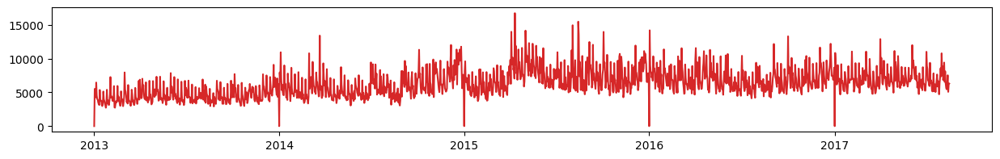

City: Libertad
Store Numbers: [36]


store_number: 36


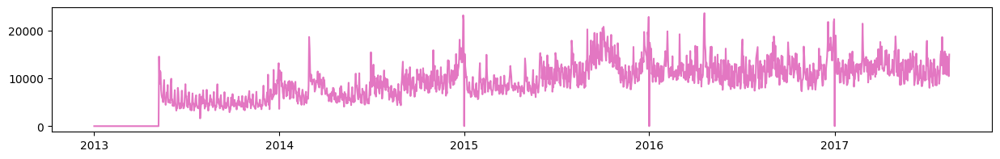

City: Loja
Store Numbers: [38]


store_number: 38


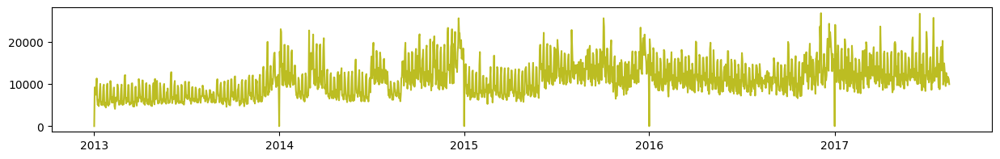

City: Machala
Store Numbers: [40, 41]


store_number: 40


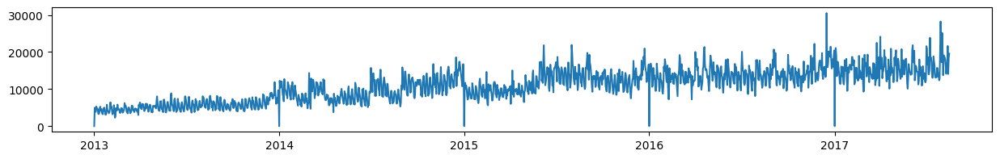

store_number: 41


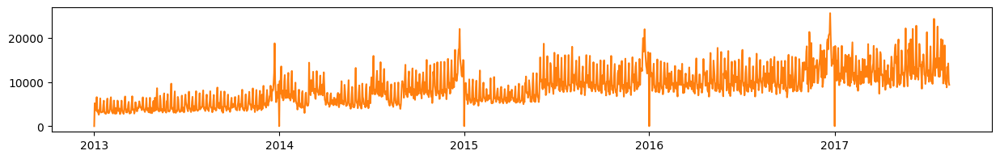

City: Manta
Store Numbers: [52, 53]


store_number: 52


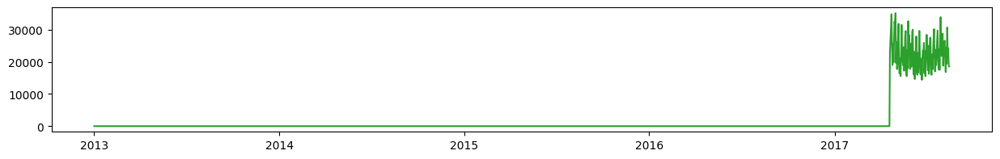

store_number: 53


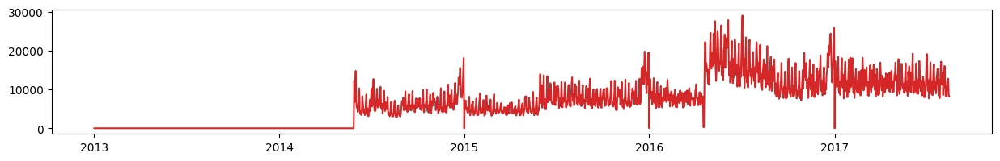

City: Playas
Store Numbers: [35]


store_number: 35


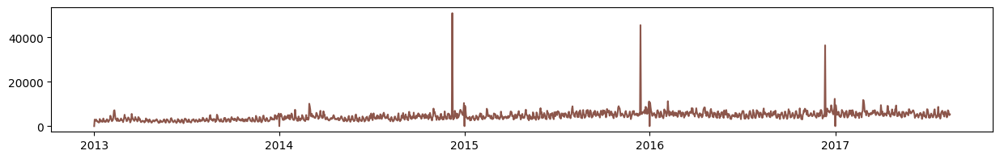

City: Puyo
Store Numbers: [22]


store_number: 22


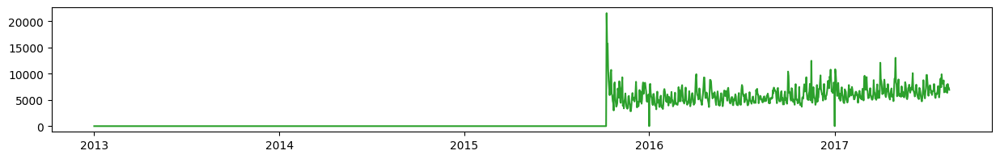

City: Quevedo
Store Numbers: [33]


store_number: 33


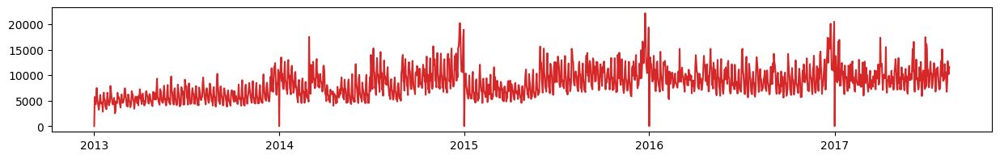

City: Quito
Store Numbers: [1, 2, 3, 4, 6, 7, 8, 9, 10, 17, 18, 20, 44, 45, 46, 47, 48, 49]


store_number: 1


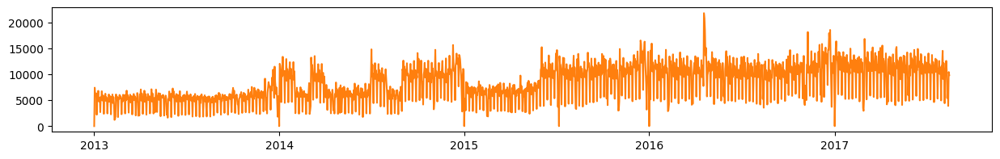

store_number: 2


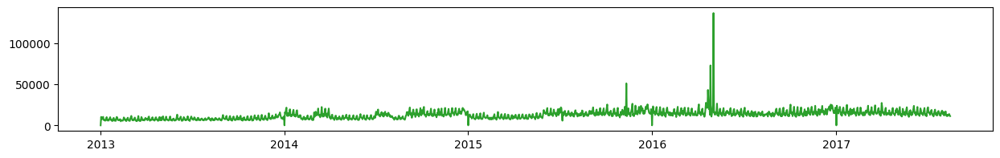

store_number: 3


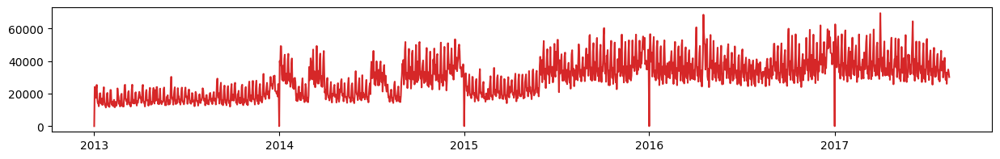

store_number: 4


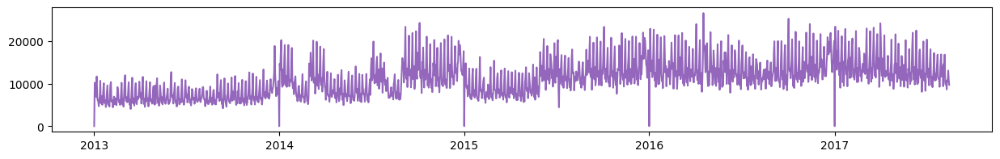

store_number: 6


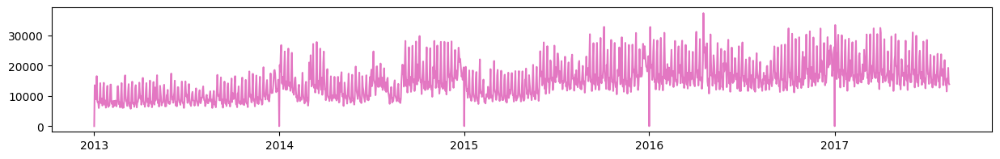

store_number: 7


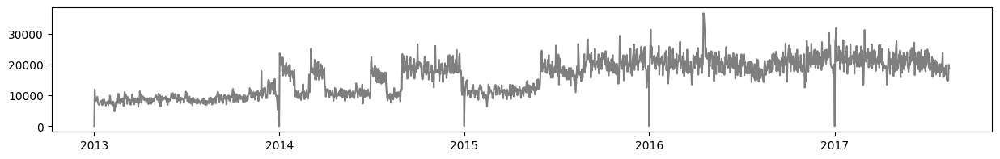

store_number: 8


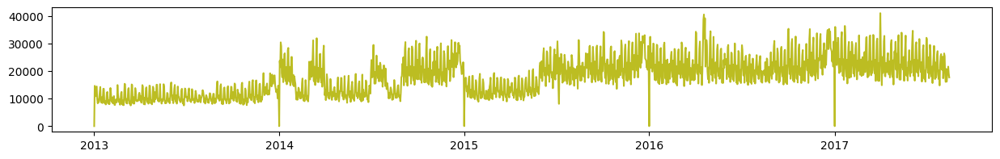

store_number: 9


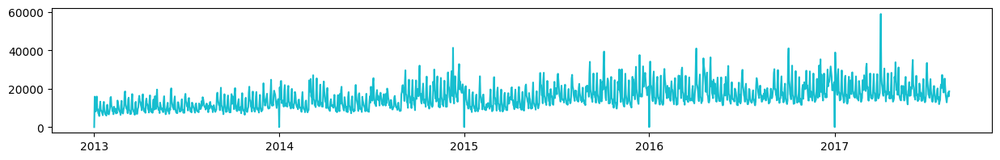

store_number: 10


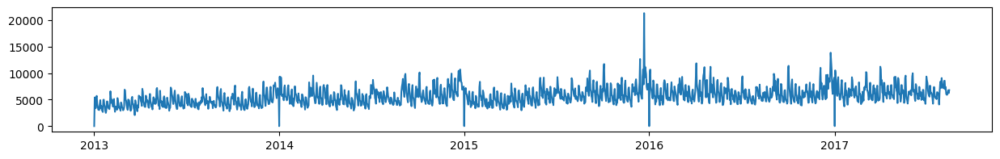

store_number: 17


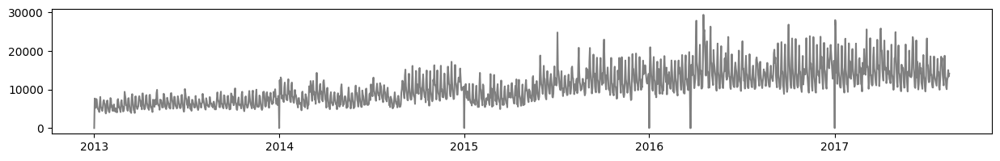

store_number: 18


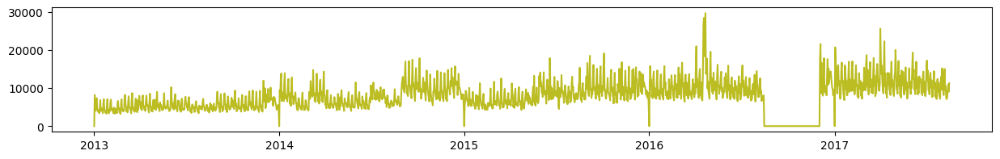

store_number: 20


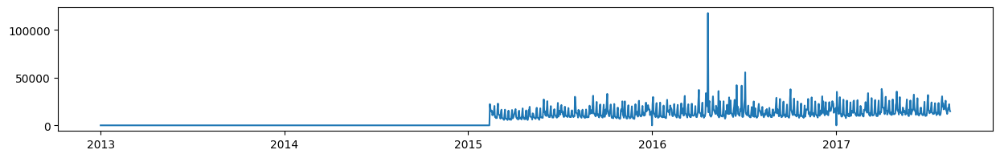

store_number: 44


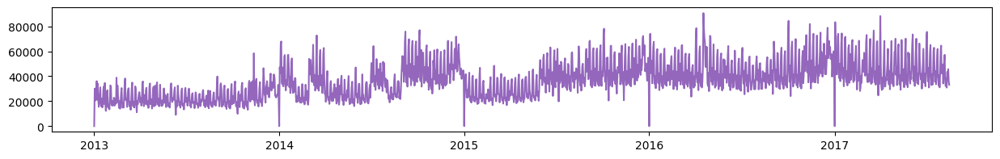

store_number: 45


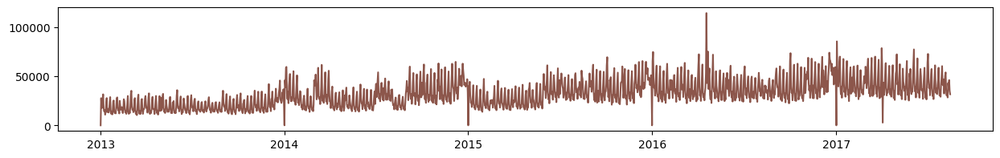

store_number: 46


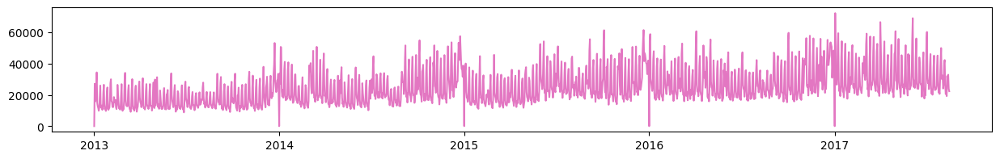

store_number: 47


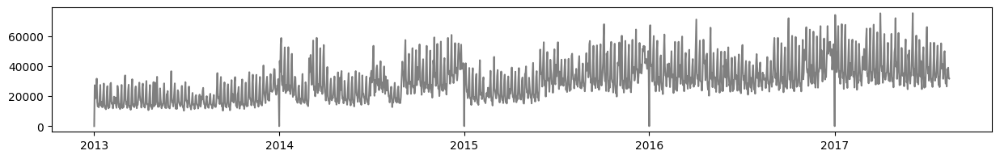

store_number: 48


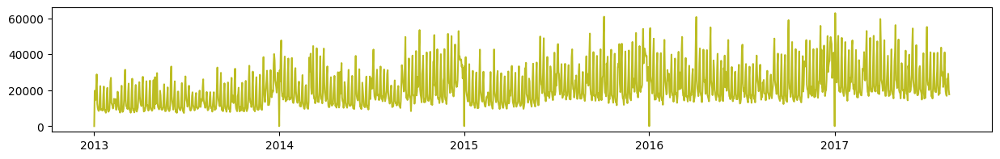

store_number: 49


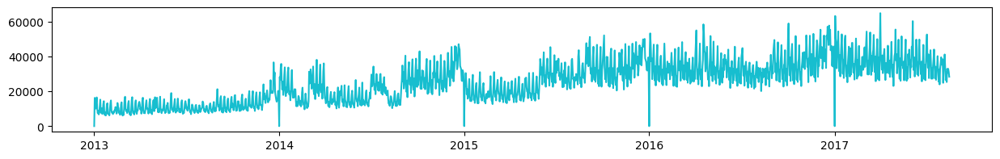

City: Riobamba
Store Numbers: [14]


store_number: 14


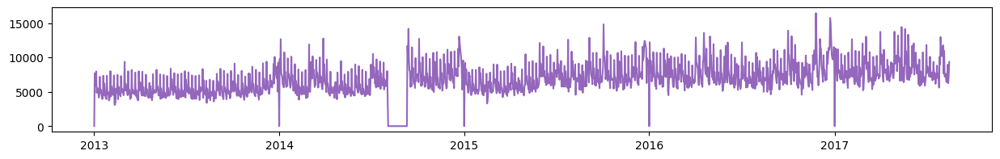

City: Salinas
Store Numbers: [25]


store_number: 25


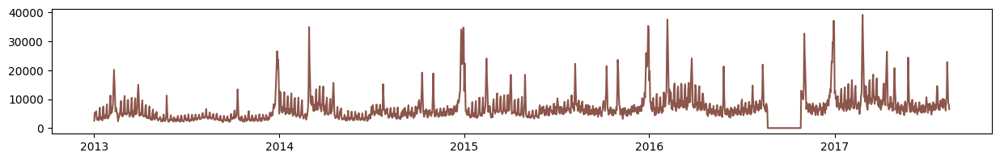

City: Santo Domingo
Store Numbers: [5, 16, 21]


store_number: 5


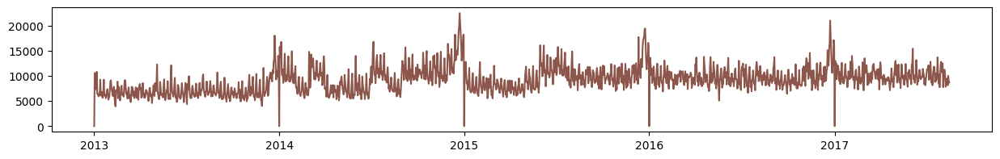

store_number: 16


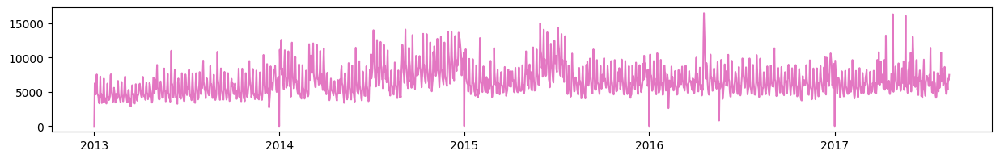

store_number: 21


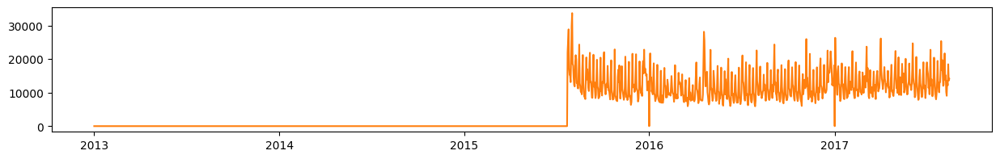

In [10]:
for city, group in store_df.groupby('city'):
    store_numbers = list(group['store_nbr'])
    print(f"City: {city}")
    print(f"Store Numbers: {store_numbers}")
    print("\n")
    for store in store_numbers:
        tmp_df = train_df[train_df['store_nbr'] == store][['date', 'agg_sales']].drop_duplicates()
        print('store_number:', store)
        plt.figure(figsize=(15, 2))
        plt.plot(tmp_df['date'], tmp_df['agg_sales'], 'C' + str(store))
        plt.show()

City: ('Ambato', 'A')
Store Numbers: [50]


store_number: 50


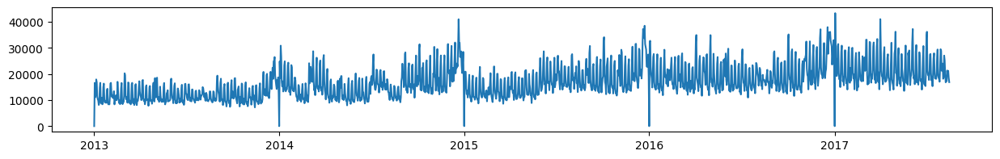

City: ('Ambato', 'D')
Store Numbers: [23]


store_number: 23


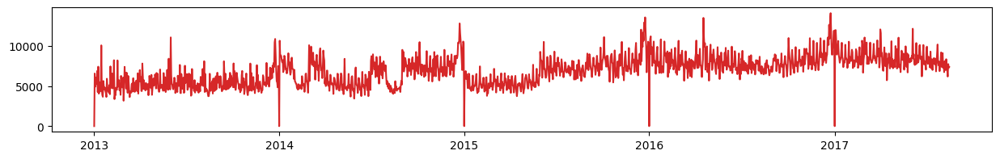

City: ('Babahoyo', 'B')
Store Numbers: [31]


store_number: 31


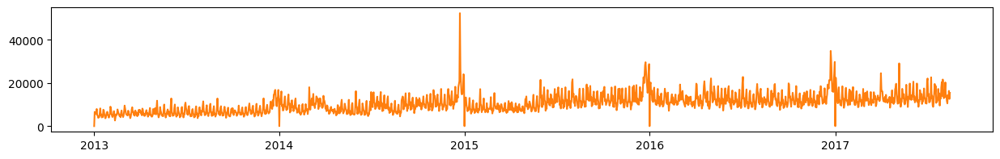

City: ('Cayambe', 'B')
Store Numbers: [11]


store_number: 11


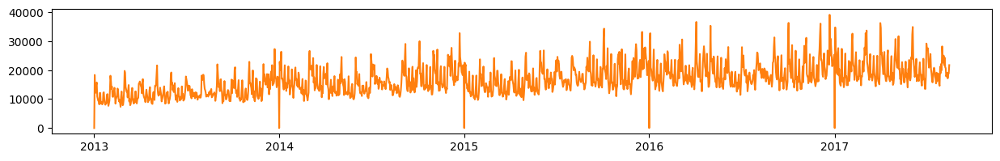

City: ('Cuenca', 'B')
Store Numbers: [39]


store_number: 39


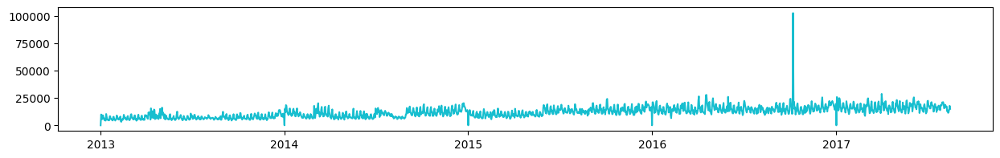

City: ('Cuenca', 'D')
Store Numbers: [37, 42]


store_number: 37


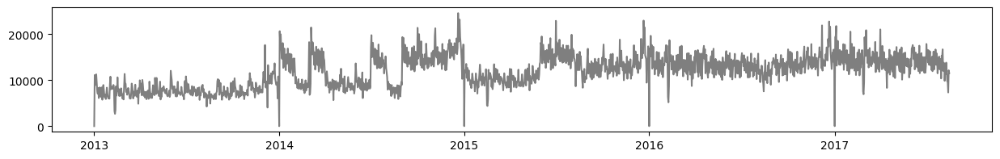

store_number: 42


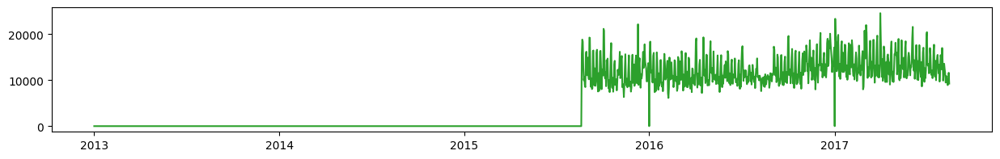

City: ('Daule', 'D')
Store Numbers: [27]


store_number: 27


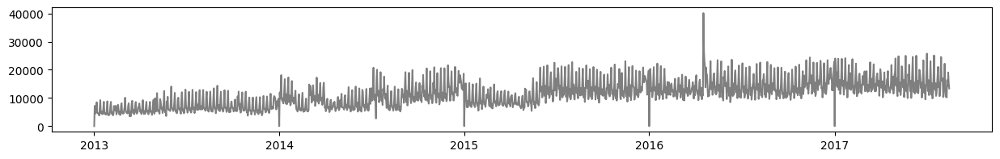

City: ('El Carmen', 'C')
Store Numbers: [54]


store_number: 54


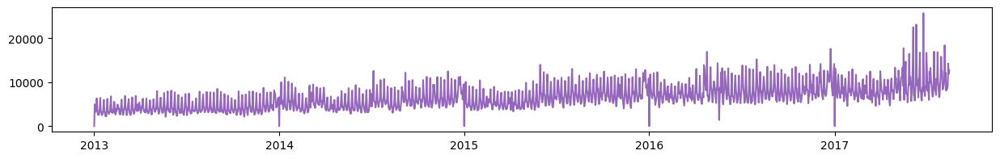

City: ('Esmeraldas', 'E')
Store Numbers: [43]


store_number: 43


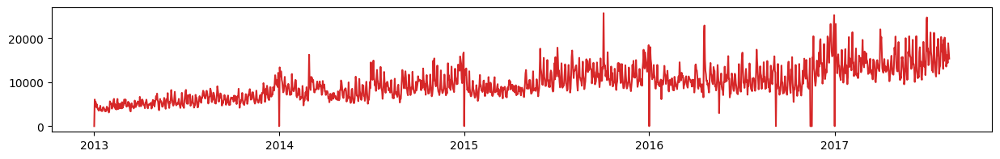

City: ('Guaranda', 'C')
Store Numbers: [19]


store_number: 19


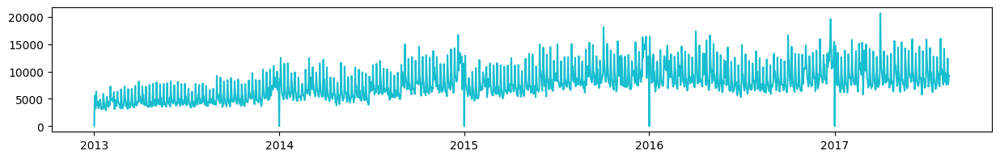

City: ('Guayaquil', 'A')
Store Numbers: [51]


store_number: 51


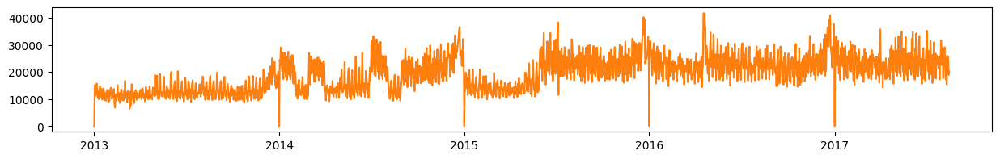

City: ('Guayaquil', 'B')
Store Numbers: [34]


store_number: 34


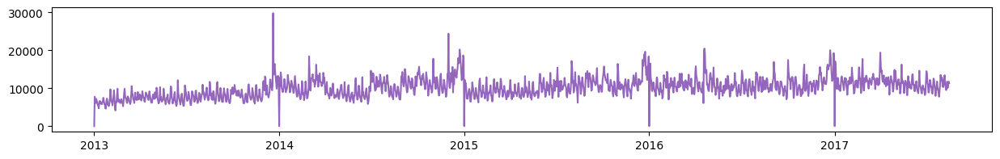

City: ('Guayaquil', 'C')
Store Numbers: [30, 32]


store_number: 30


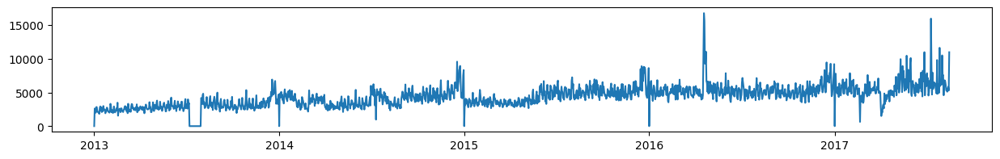

store_number: 32


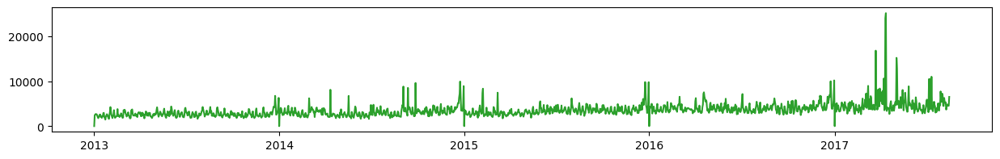

City: ('Guayaquil', 'D')
Store Numbers: [24, 26]


store_number: 24


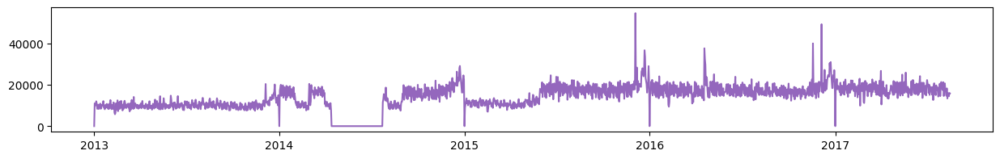

store_number: 26


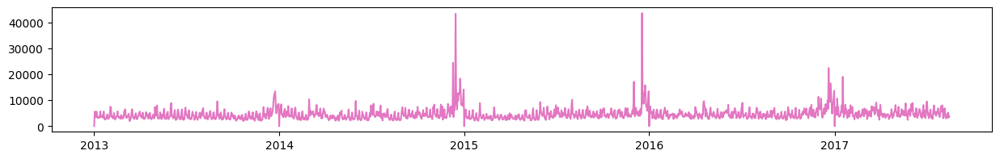

City: ('Guayaquil', 'E')
Store Numbers: [28, 29]


store_number: 28


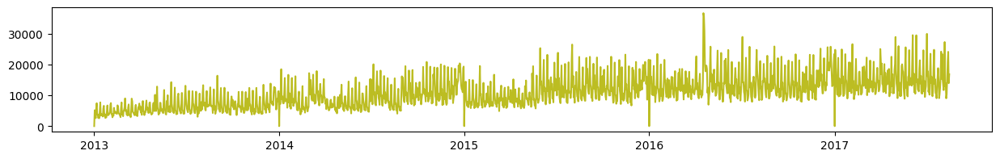

store_number: 29


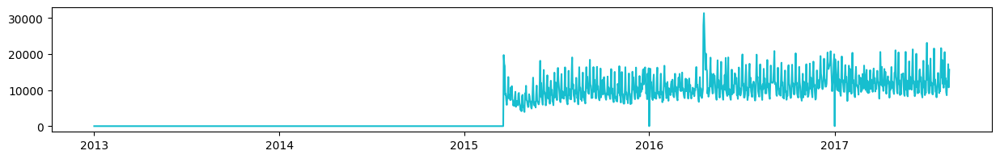

City: ('Ibarra', 'C')
Store Numbers: [15]


store_number: 15


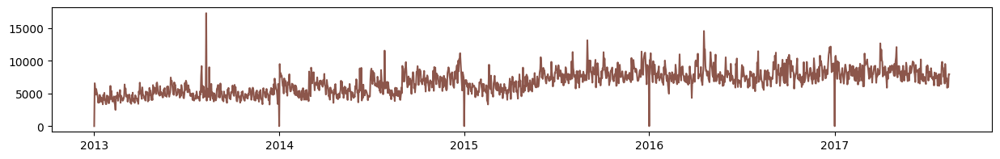

City: ('Latacunga', 'C')
Store Numbers: [12, 13]


store_number: 12


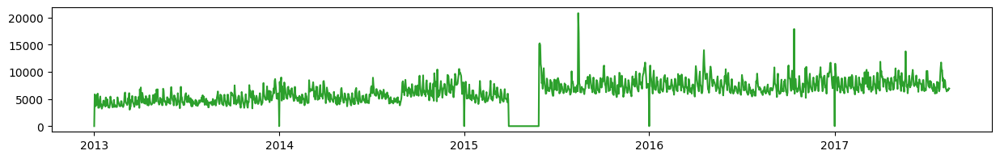

store_number: 13


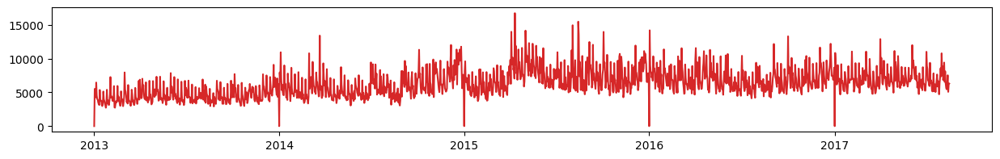

City: ('Libertad', 'E')
Store Numbers: [36]


store_number: 36


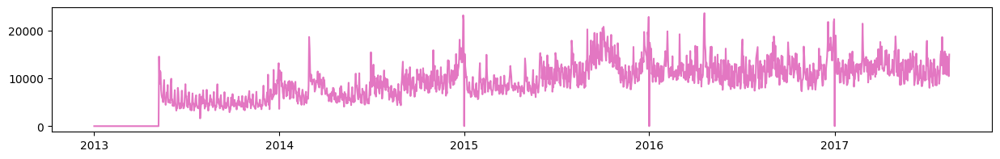

City: ('Loja', 'D')
Store Numbers: [38]


store_number: 38


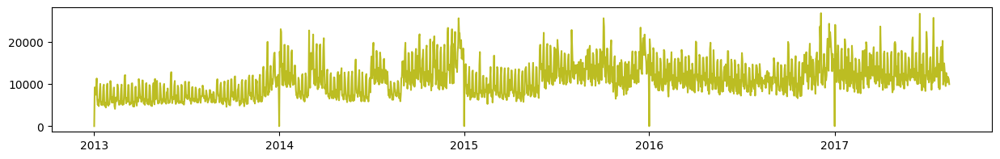

City: ('Machala', 'C')
Store Numbers: [40]


store_number: 40


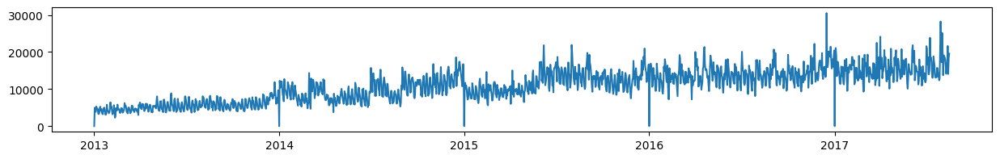

City: ('Machala', 'D')
Store Numbers: [41]


store_number: 41


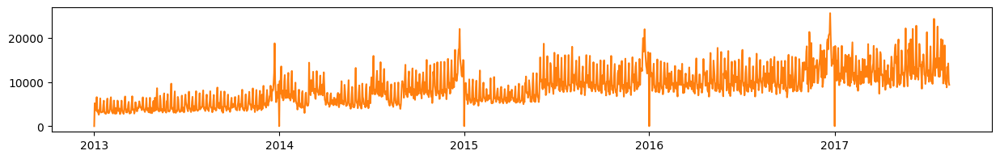

City: ('Manta', 'A')
Store Numbers: [52]


store_number: 52


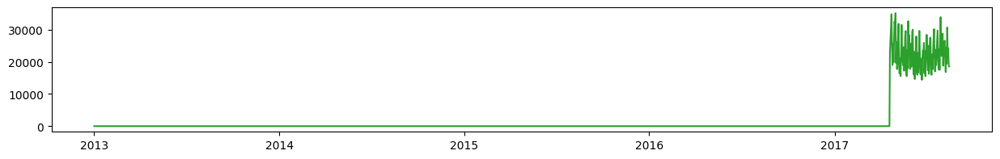

City: ('Manta', 'D')
Store Numbers: [53]


store_number: 53


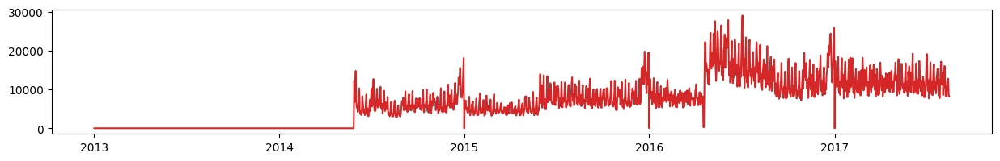

City: ('Playas', 'C')
Store Numbers: [35]


store_number: 35


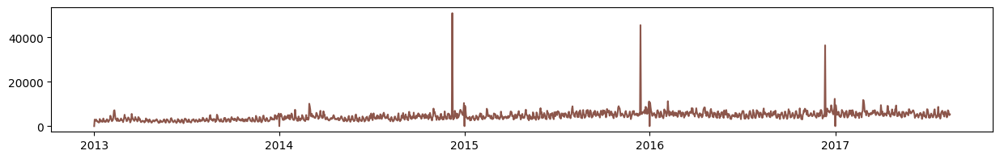

City: ('Puyo', 'C')
Store Numbers: [22]


store_number: 22


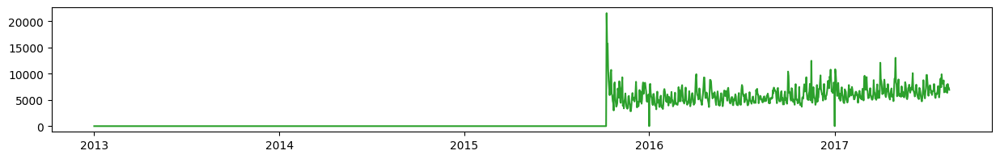

City: ('Quevedo', 'C')
Store Numbers: [33]


store_number: 33


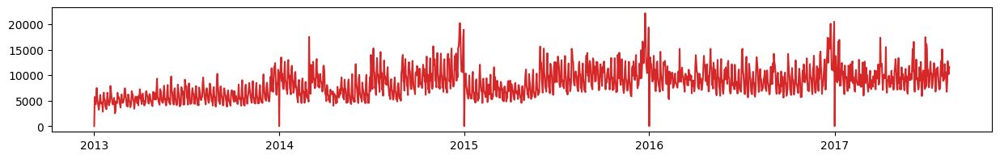

City: ('Quito', 'A')
Store Numbers: [44, 45, 46, 47, 48, 49]


store_number: 44


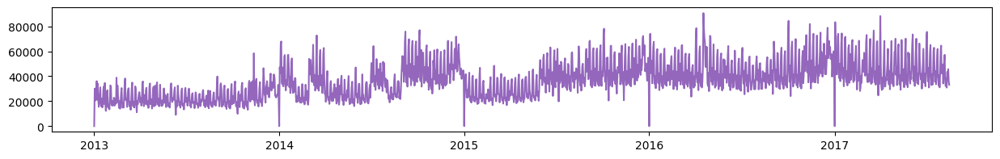

store_number: 45


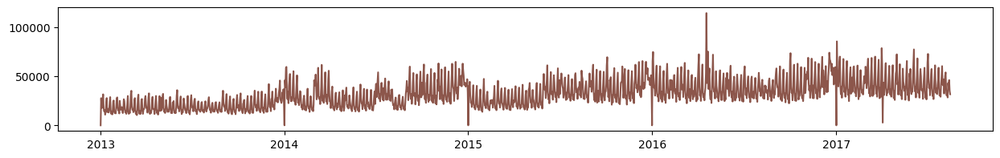

store_number: 46


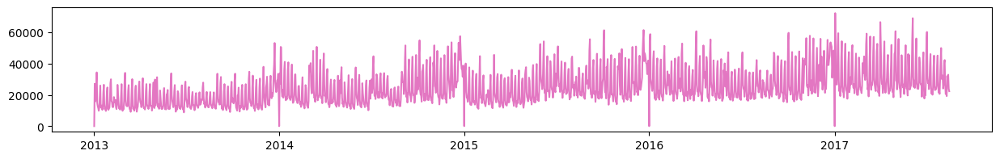

store_number: 47


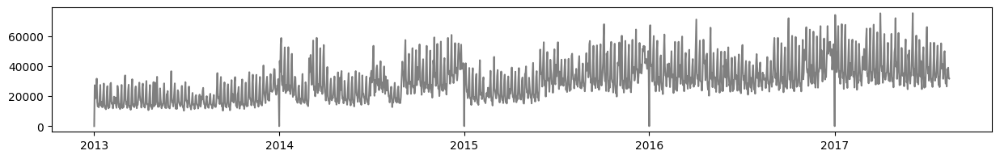

store_number: 48


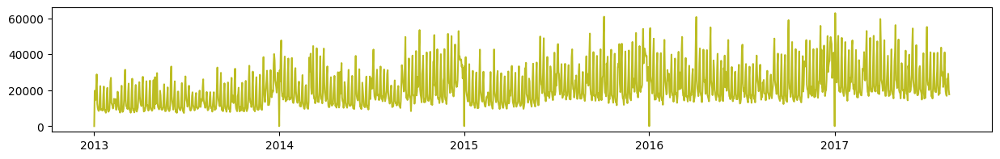

store_number: 49


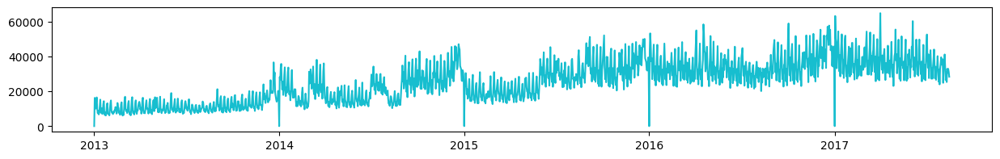

City: ('Quito', 'B')
Store Numbers: [9, 18, 20]


store_number: 9


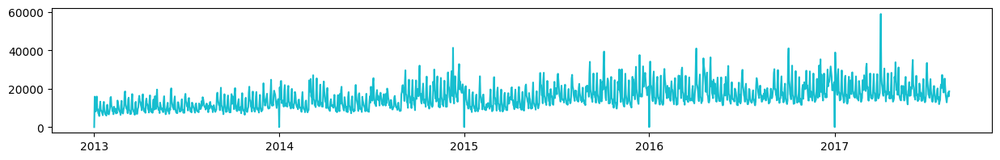

store_number: 18


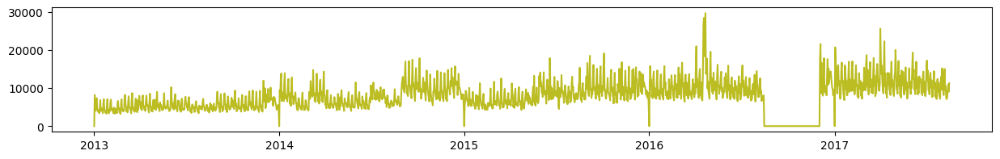

store_number: 20


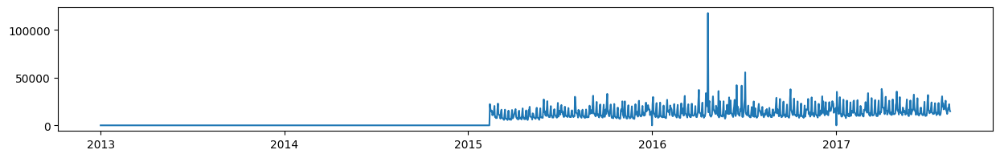

City: ('Quito', 'C')
Store Numbers: [10, 17]


store_number: 10


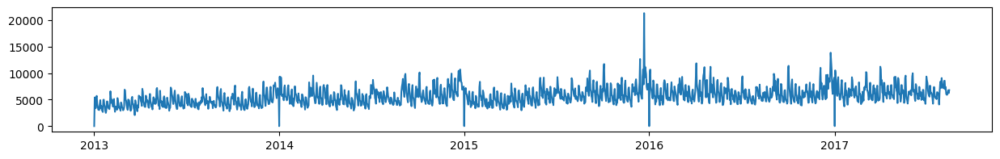

store_number: 17


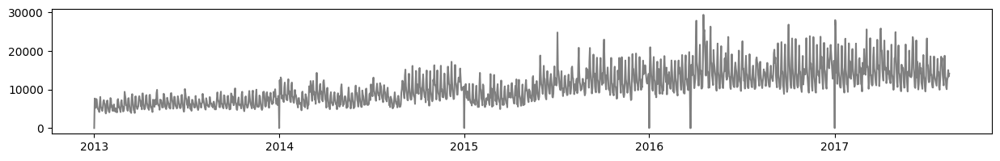

City: ('Quito', 'D')
Store Numbers: [1, 2, 3, 4, 6, 7, 8]


store_number: 1


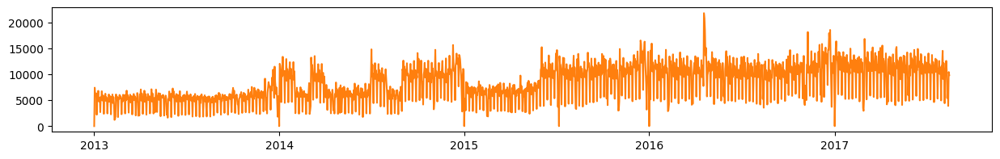

store_number: 2


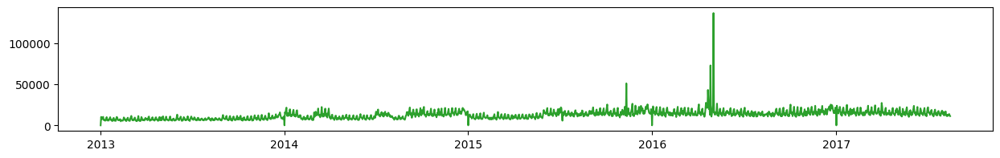

store_number: 3


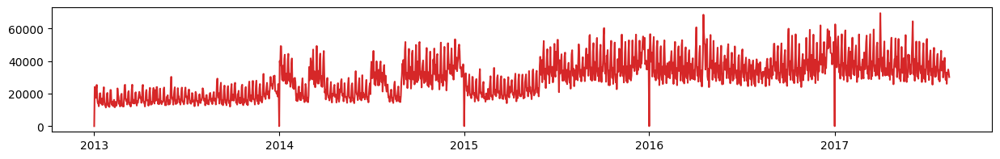

store_number: 4


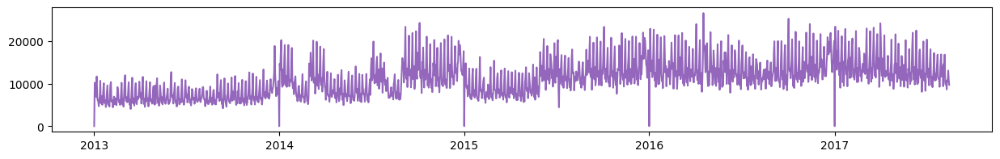

store_number: 6


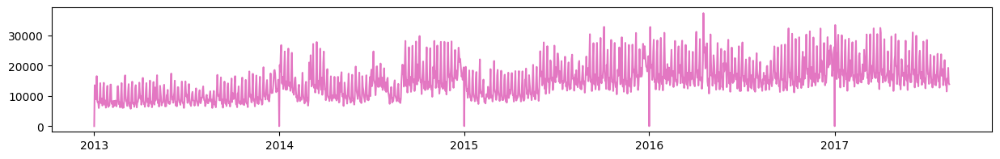

store_number: 7


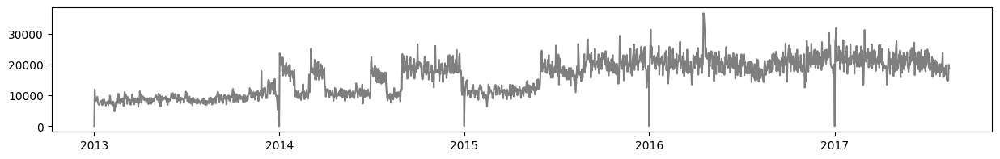

store_number: 8


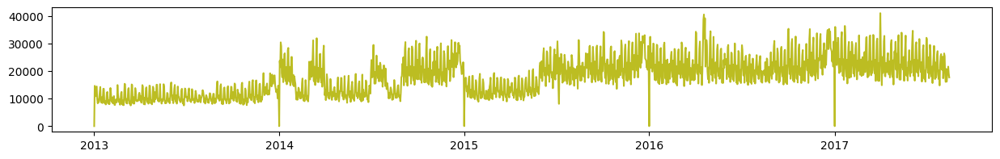

City: ('Riobamba', 'C')
Store Numbers: [14]


store_number: 14


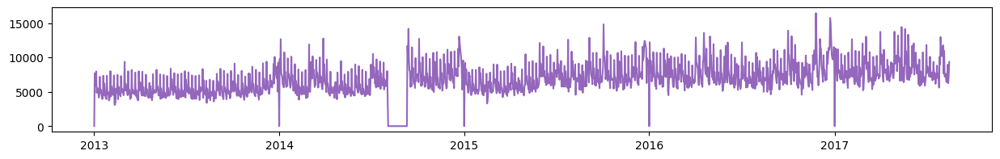

City: ('Salinas', 'D')
Store Numbers: [25]


store_number: 25


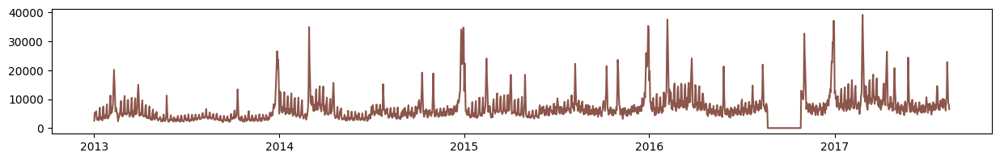

City: ('Santo Domingo', 'B')
Store Numbers: [21]


store_number: 21


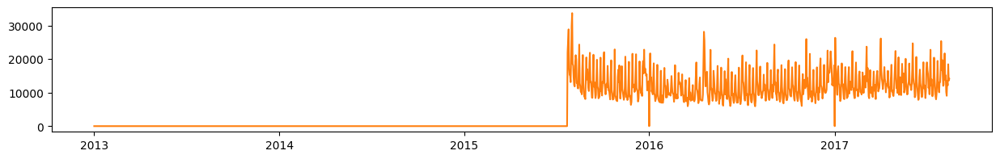

City: ('Santo Domingo', 'C')
Store Numbers: [16]


store_number: 16


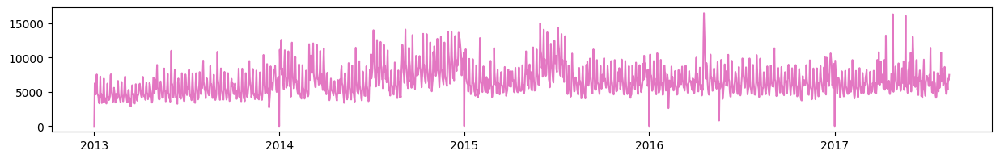

City: ('Santo Domingo', 'D')
Store Numbers: [5]


store_number: 5


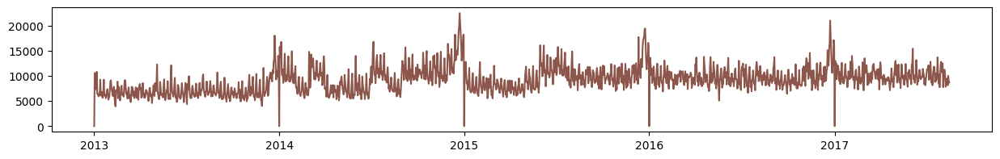

In [11]:
for city, group in store_df.groupby(['city','type']):
    store_numbers = list(group['store_nbr'])
    print(f"City: {city}")
    print(f"Store Numbers: {store_numbers}")
    print("\n")
    for store in store_numbers:
        tmp_df = train_df[train_df['store_nbr'] == store][['date', 'agg_sales']].drop_duplicates()

        print('store_number:', store)
        plt.figure(figsize=(15, 2))
        plt.plot(tmp_df['date'], tmp_df['agg_sales'], 'C' + str(store))
        plt.show()

In [12]:
mode_store_type = store_df.groupby('state')['type'].agg(lambda x: x.value_counts().index[0])

In [13]:
mode_store_type

state
Azuay                             D
Bolivar                           C
Chimborazo                        C
Cotopaxi                          C
El Oro                            C
Esmeraldas                        E
Guayas                            D
Imbabura                          C
Loja                              D
Los Rios                          B
Manabi                            A
Pastaza                           C
Pichincha                         D
Santa Elena                       D
Santo Domingo de los Tsachilas    D
Tungurahua                        D
Name: type, dtype: object

In [14]:
cluster_freq = store_df['cluster'].value_counts()

In [15]:
cluster_freq

cluster
3     7
10    6
6     6
15    5
13    4
14    4
11    3
4     3
8     3
1     3
2     2
9     2
7     2
12    1
16    1
5     1
17    1
Name: count, dtype: int64

In [16]:
mode_store_type = store_df.groupby('state')['type'].agg(lambda x: x.value_counts().index[0])

In [17]:
mode_store_type

state
Azuay                             D
Bolivar                           C
Chimborazo                        C
Cotopaxi                          C
El Oro                            C
Esmeraldas                        E
Guayas                            D
Imbabura                          C
Loja                              D
Los Rios                          B
Manabi                            A
Pastaza                           C
Pichincha                         D
Santa Elena                       D
Santo Domingo de los Tsachilas    D
Tungurahua                        D
Name: type, dtype: object

<Figure size 1000x600 with 0 Axes>

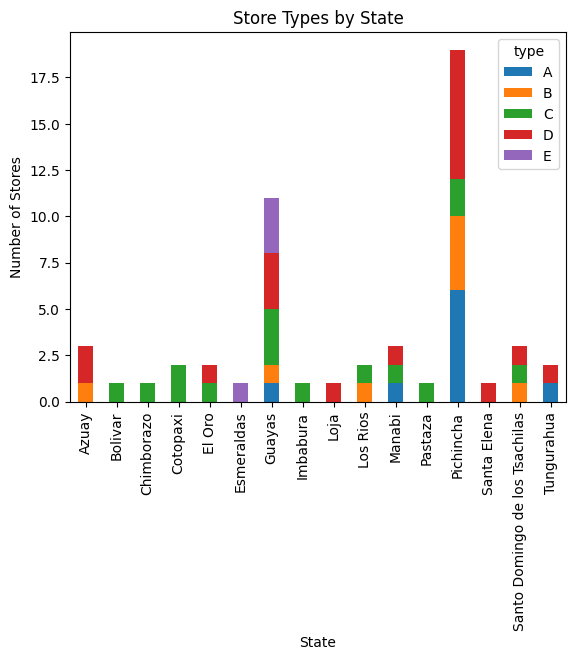

In [18]:
plt.figure(figsize=(10, 6))
store_df.groupby(['state', 'type']).size().unstack().plot(kind='bar', stacked=True)
plt.title('Store Types by State')
plt.xlabel('State')
plt.ylabel('Number of Stores')
plt.show()

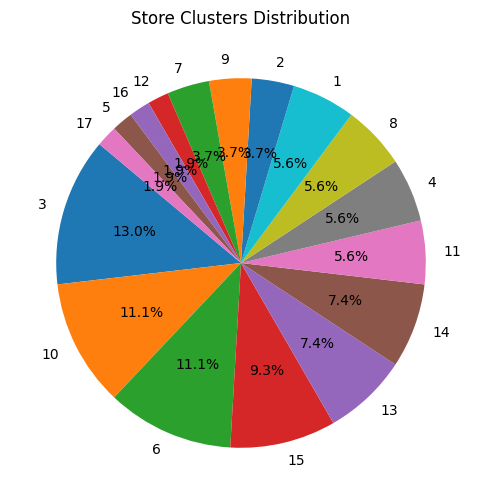

In [19]:
plt.figure(figsize=(6, 6))
plt.pie(cluster_freq, labels=cluster_freq.index, autopct='%1.1f%%', startangle=140)
plt.title('Store Clusters Distribution')
plt.show()

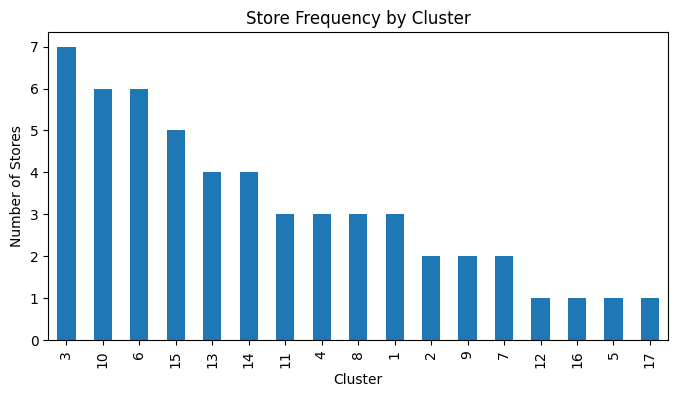

In [20]:
plt.figure(figsize=(8, 4))
cluster_freq.plot(kind='bar')
plt.title('Store Frequency by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Stores')
plt.show()

In [21]:
clusters_data = store_df[store_df['cluster'].isin([3, 6, 10])]

In [22]:
clusters_data

,store_nbr,city,state,type,cluster
8,9,Quito,Pichincha,B,6
10,11,Cayambe,Pichincha,B,6
15,16,Santo Domingo,Santo Domingo de los Tsachilas,C,3
19,20,Quito,Pichincha,B,6
20,21,Santo Domingo,Santo Domingo de los Tsachilas,B,6
25,26,Guayaquil,Guayas,D,10
27,28,Guayaquil,Guayas,E,10
28,29,Guayaquil,Guayas,E,10
29,30,Guayaquil,Guayas,C,3
30,31,Babahoyo,Los Rios,B,10


In [23]:
type_C_stores = store_df[store_df['type'] == 'C']
type_B_stores = store_df[store_df['type'] == 'B']

print("Stores in type C:")
print(type_C_stores)
print('------------------------------------------------------------------------------------------','\n')
print("Stores in type B:")
print(type_B_stores)


Stores in type C:
    store_nbr           city                           state type  cluster
9          10          Quito                       Pichincha    C       15
11         12      Latacunga                        Cotopaxi    C       15
12         13      Latacunga                        Cotopaxi    C       15
13         14       Riobamba                      Chimborazo    C        7
14         15         Ibarra                        Imbabura    C       15
15         16  Santo Domingo  Santo Domingo de los Tsachilas    C        3
16         17          Quito                       Pichincha    C       12
18         19       Guaranda                         Bolivar    C       15
21         22           Puyo                         Pastaza    C        7
29         30      Guayaquil                          Guayas    C        3
31         32      Guayaquil                          Guayas    C        3
32         33        Quevedo                        Los Rios    C        3
34     

City and Cluster: ('Ambato', 9)
Store Numbers: [23]


store_number: 23


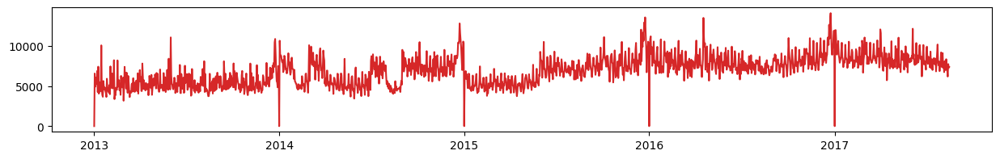

City and Cluster: ('Ambato', 14)
Store Numbers: [50]


store_number: 50


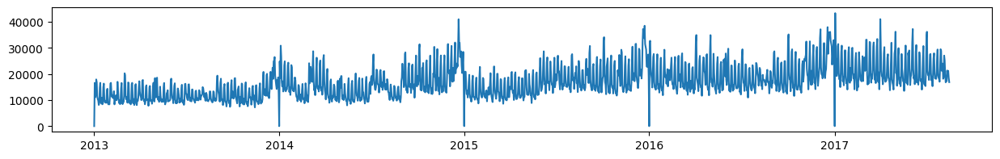

City and Cluster: ('Babahoyo', 10)
Store Numbers: [31]


store_number: 31


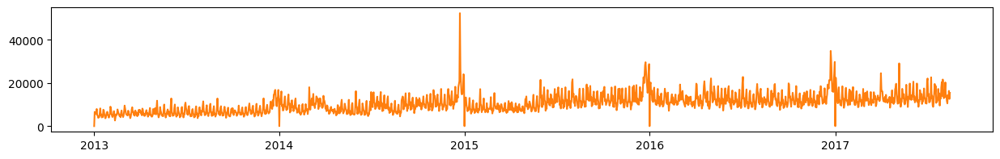

City and Cluster: ('Cayambe', 6)
Store Numbers: [11]


store_number: 11


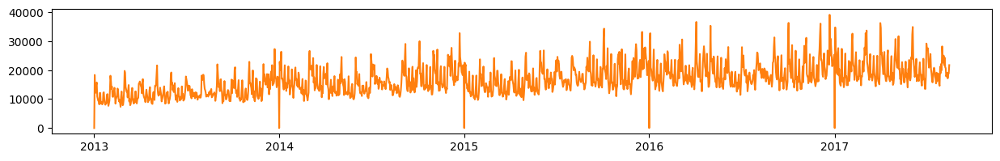

City and Cluster: ('Cuenca', 2)
Store Numbers: [37, 42]


store_number: 37


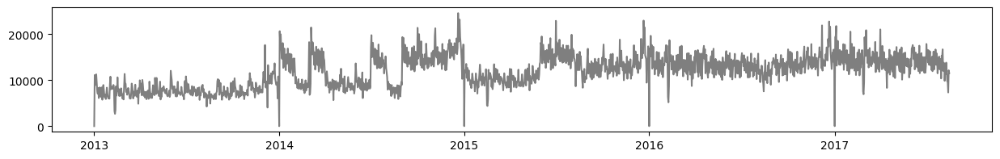

store_number: 42


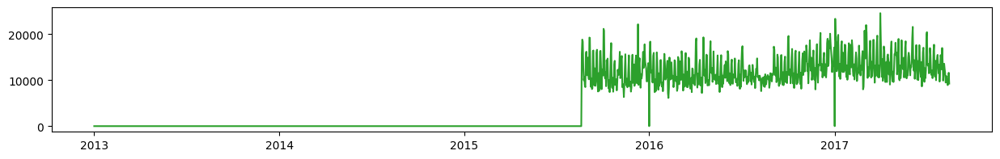

City and Cluster: ('Cuenca', 6)
Store Numbers: [39]


store_number: 39


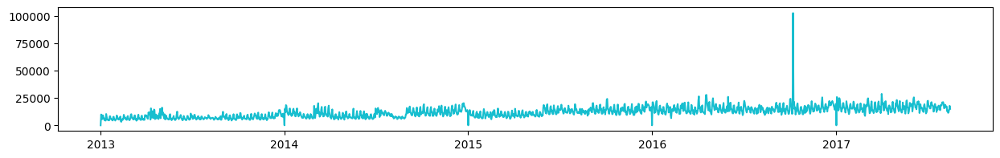

City and Cluster: ('Daule', 1)
Store Numbers: [27]


store_number: 27


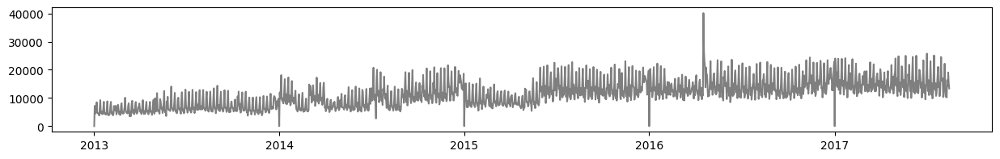

City and Cluster: ('El Carmen', 3)
Store Numbers: [54]


store_number: 54


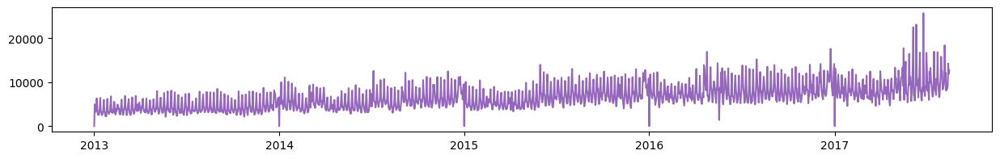

City and Cluster: ('Esmeraldas', 10)
Store Numbers: [43]


store_number: 43


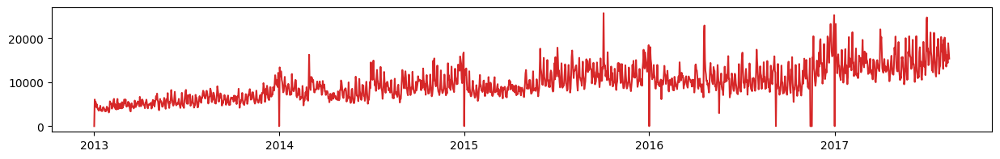

City and Cluster: ('Guaranda', 15)
Store Numbers: [19]


store_number: 19


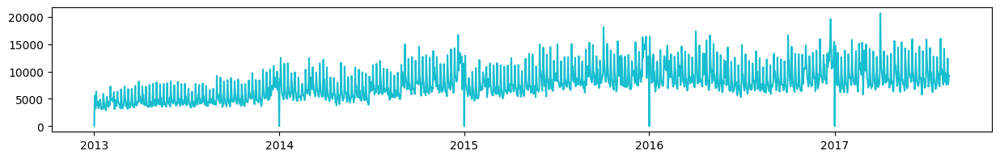

City and Cluster: ('Guayaquil', 1)
Store Numbers: [24]


store_number: 24


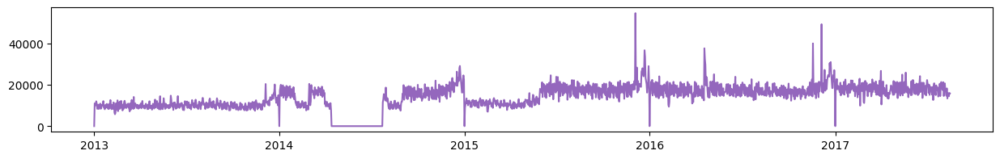

City and Cluster: ('Guayaquil', 3)
Store Numbers: [30, 32]


store_number: 30


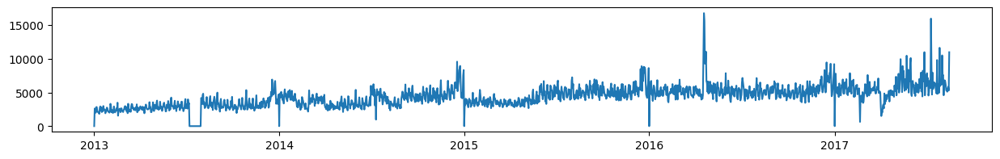

store_number: 32


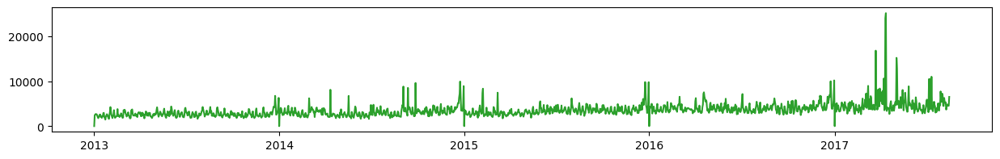

City and Cluster: ('Guayaquil', 6)
Store Numbers: [34]


store_number: 34


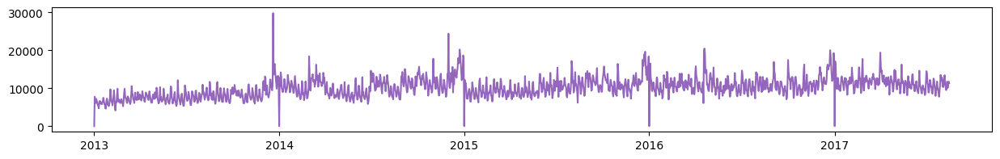

City and Cluster: ('Guayaquil', 10)
Store Numbers: [26, 28, 29]


store_number: 26


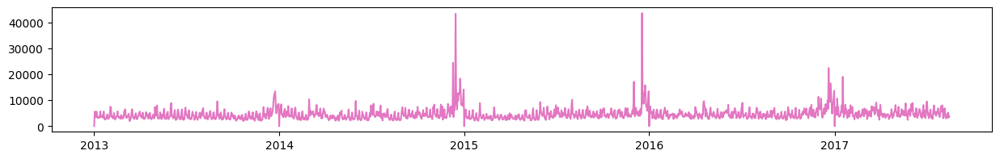

store_number: 28


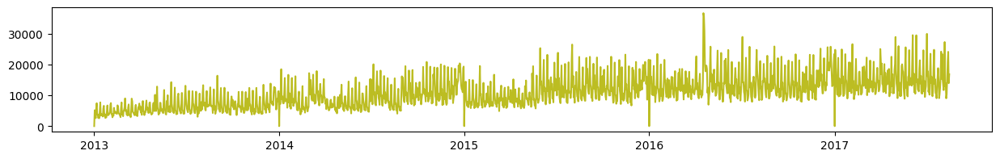

store_number: 29


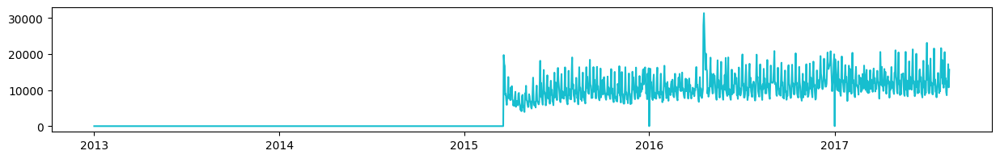

City and Cluster: ('Guayaquil', 17)
Store Numbers: [51]


store_number: 51


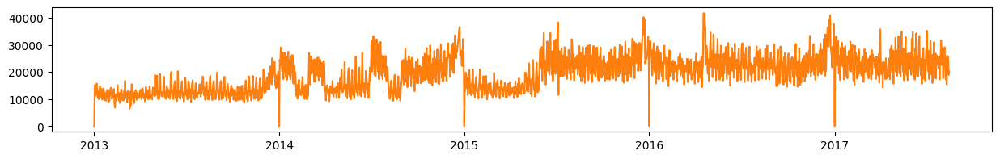

City and Cluster: ('Ibarra', 15)
Store Numbers: [15]


store_number: 15


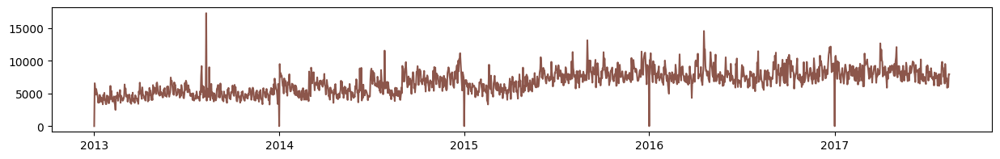

City and Cluster: ('Latacunga', 15)
Store Numbers: [12, 13]


store_number: 12


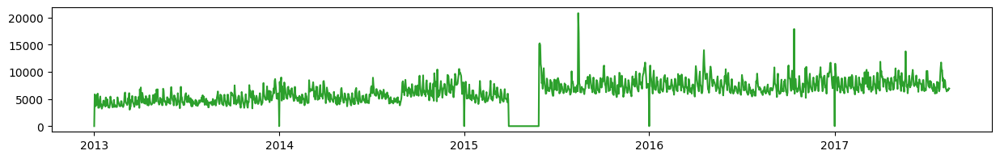

store_number: 13


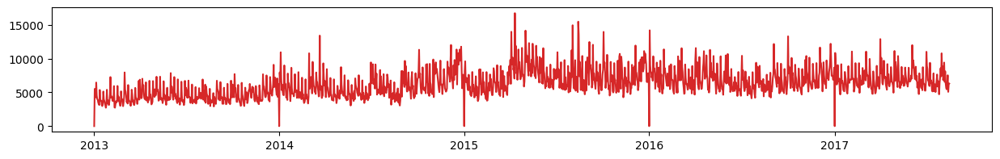

City and Cluster: ('Libertad', 10)
Store Numbers: [36]


store_number: 36


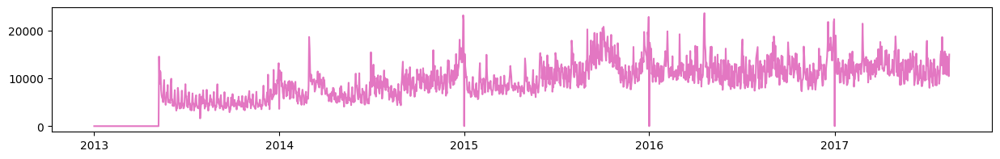

City and Cluster: ('Loja', 4)
Store Numbers: [38]


store_number: 38


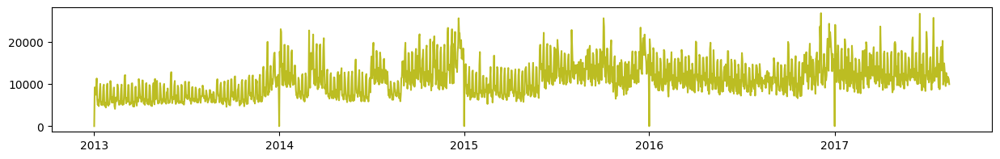

City and Cluster: ('Machala', 3)
Store Numbers: [40]


store_number: 40


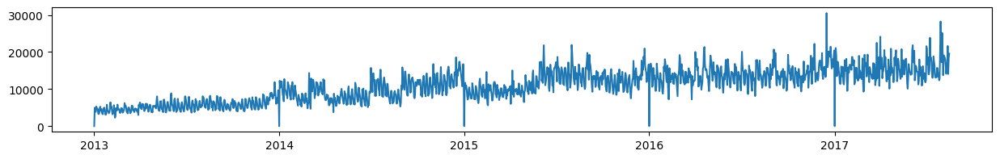

City and Cluster: ('Machala', 4)
Store Numbers: [41]


store_number: 41


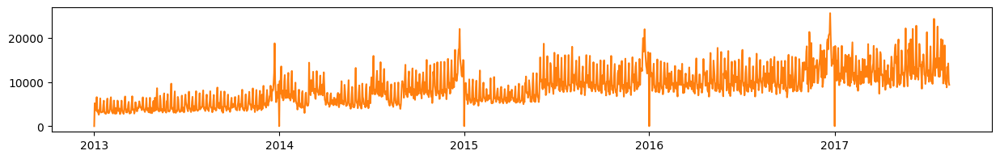

City and Cluster: ('Manta', 11)
Store Numbers: [52]


store_number: 52


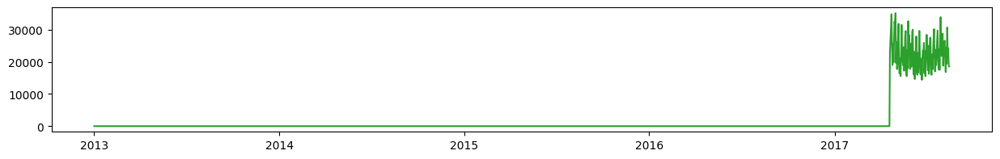

City and Cluster: ('Manta', 13)
Store Numbers: [53]


store_number: 53


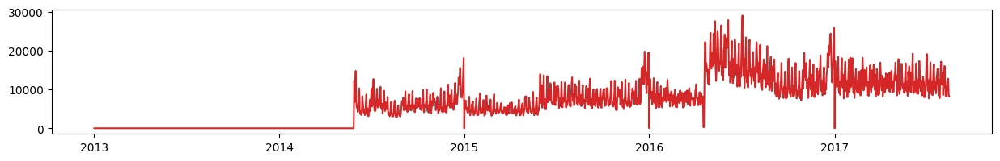

City and Cluster: ('Playas', 3)
Store Numbers: [35]


store_number: 35


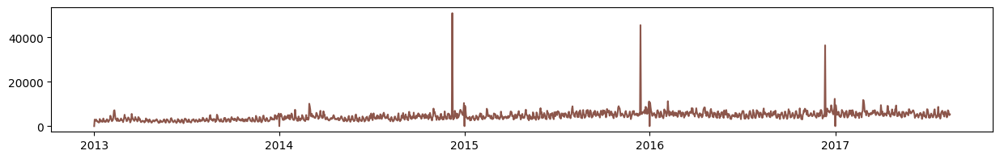

City and Cluster: ('Puyo', 7)
Store Numbers: [22]


store_number: 22


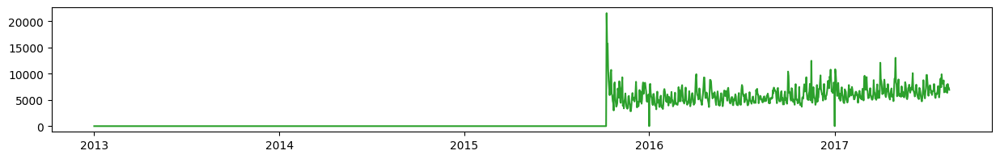

City and Cluster: ('Quevedo', 3)
Store Numbers: [33]


store_number: 33


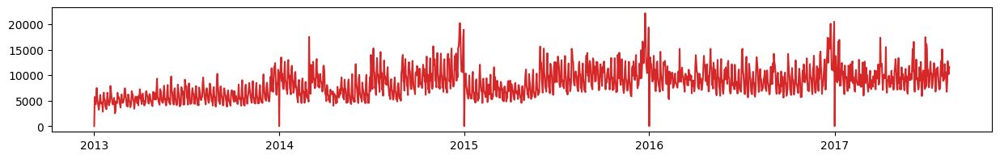

City and Cluster: ('Quito', 5)
Store Numbers: [44]


store_number: 44


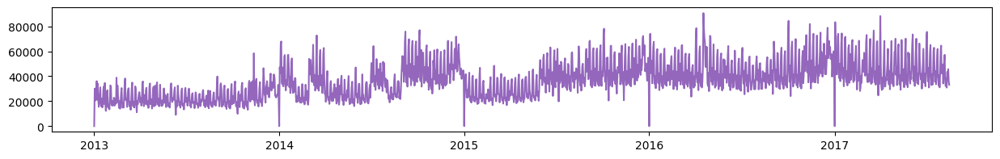

City and Cluster: ('Quito', 6)
Store Numbers: [9, 20]


store_number: 9


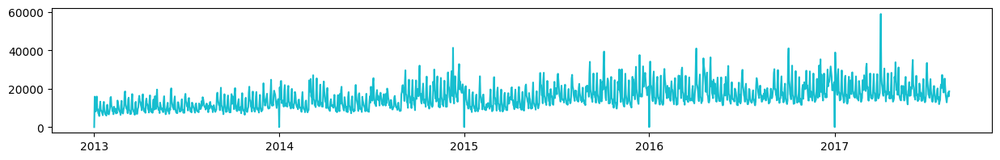

store_number: 20


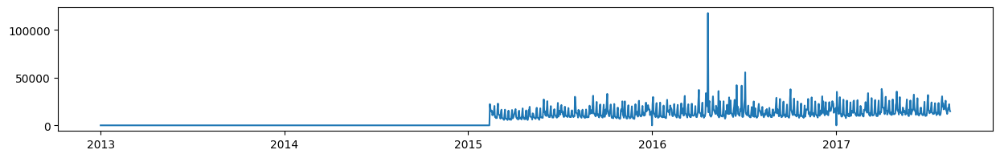

City and Cluster: ('Quito', 8)
Store Numbers: [3, 7, 8]


store_number: 3


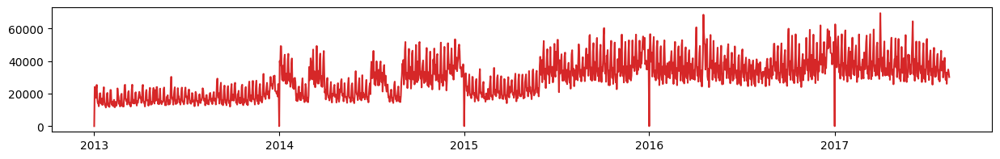

store_number: 7


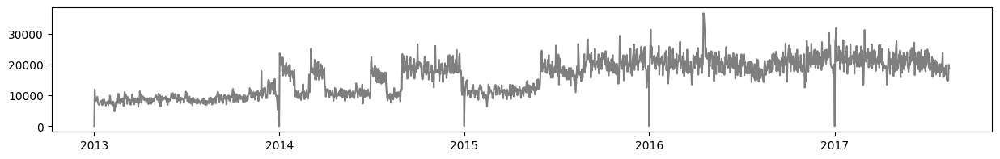

store_number: 8


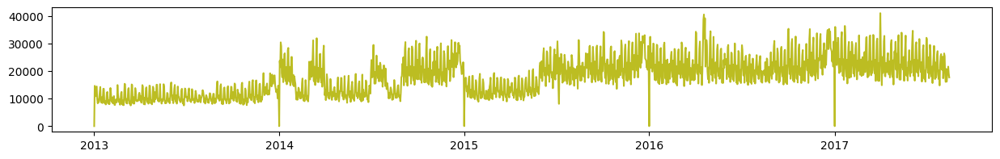

City and Cluster: ('Quito', 9)
Store Numbers: [4]


store_number: 4


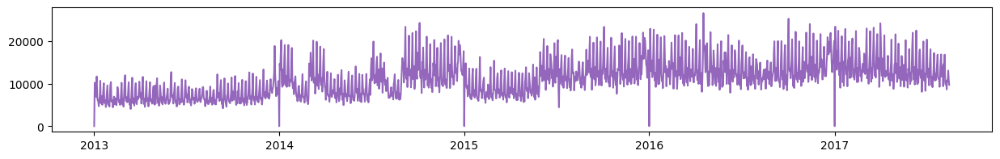

City and Cluster: ('Quito', 11)
Store Numbers: [45, 49]


store_number: 45


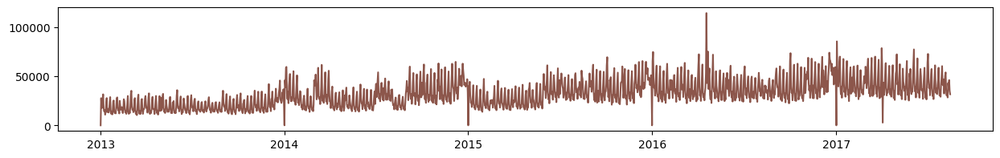

store_number: 49


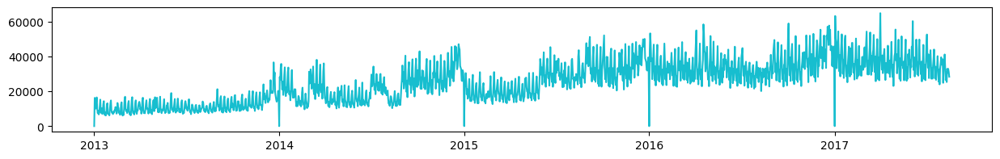

City and Cluster: ('Quito', 12)
Store Numbers: [17]


store_number: 17


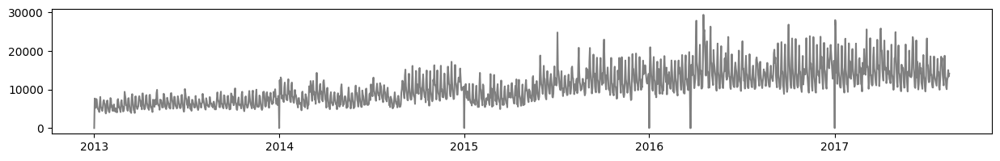

City and Cluster: ('Quito', 13)
Store Numbers: [1, 2, 6]


store_number: 1


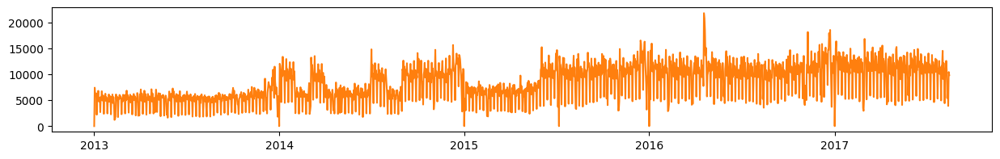

store_number: 2


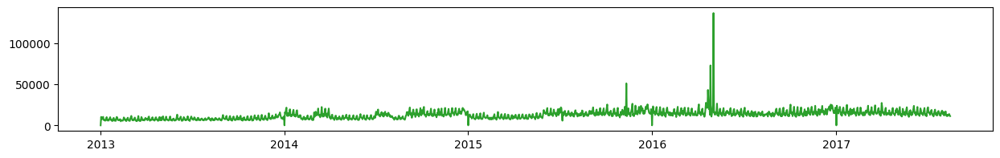

store_number: 6


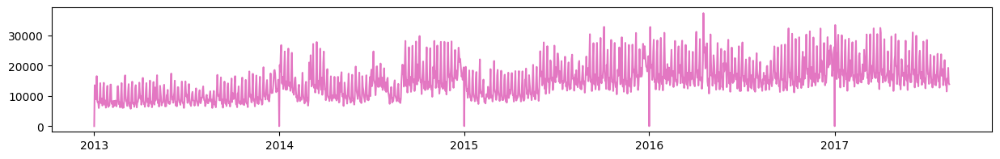

City and Cluster: ('Quito', 14)
Store Numbers: [46, 47, 48]


store_number: 46


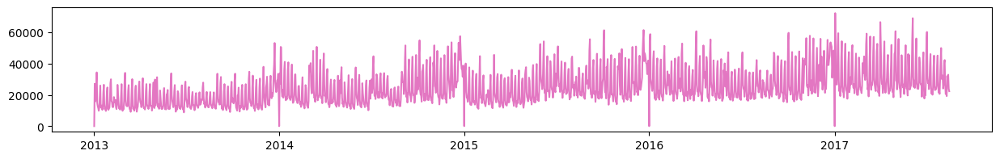

store_number: 47


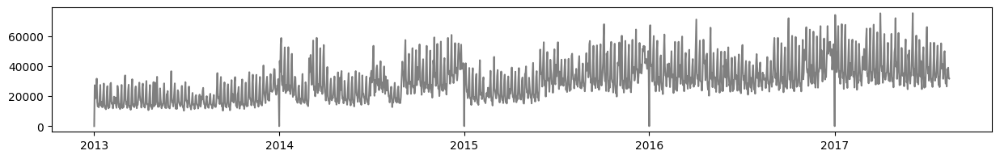

store_number: 48


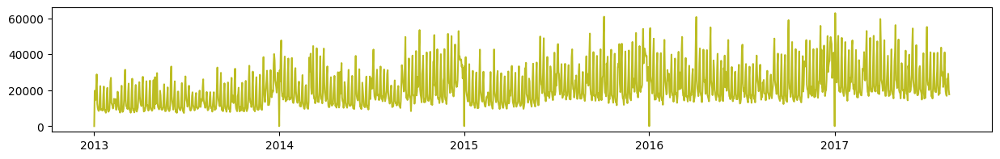

City and Cluster: ('Quito', 15)
Store Numbers: [10]


store_number: 10


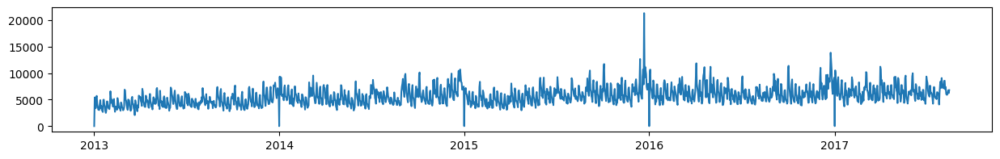

City and Cluster: ('Quito', 16)
Store Numbers: [18]


store_number: 18


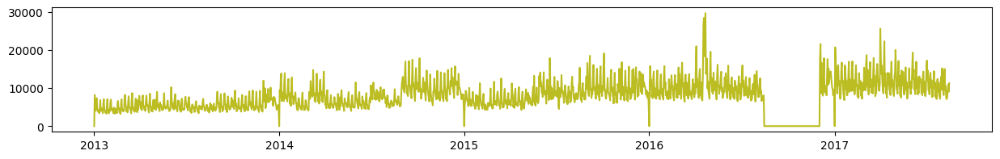

City and Cluster: ('Riobamba', 7)
Store Numbers: [14]


store_number: 14


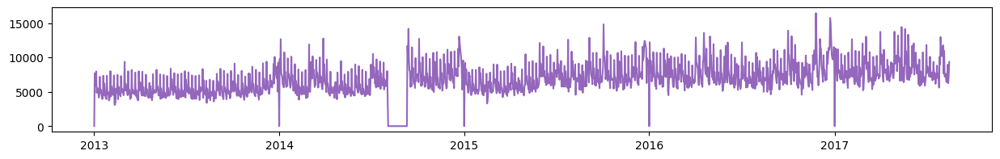

City and Cluster: ('Salinas', 1)
Store Numbers: [25]


store_number: 25


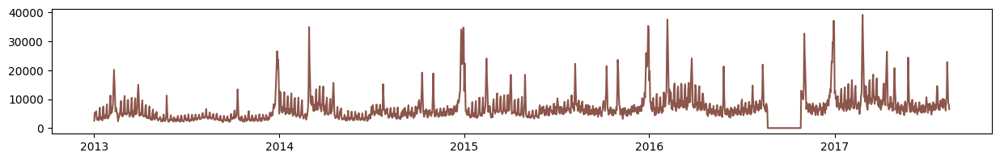

City and Cluster: ('Santo Domingo', 3)
Store Numbers: [16]


store_number: 16


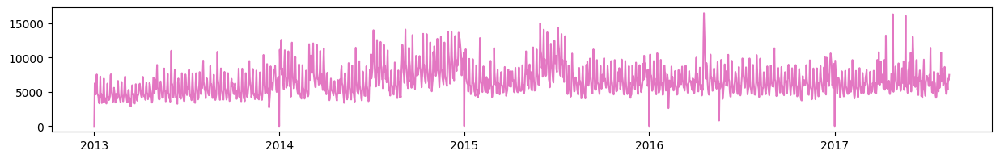

City and Cluster: ('Santo Domingo', 4)
Store Numbers: [5]


store_number: 5


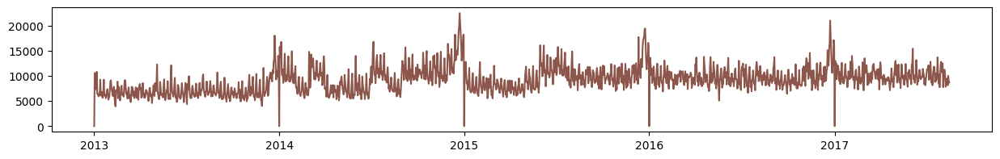

City and Cluster: ('Santo Domingo', 6)
Store Numbers: [21]


store_number: 21


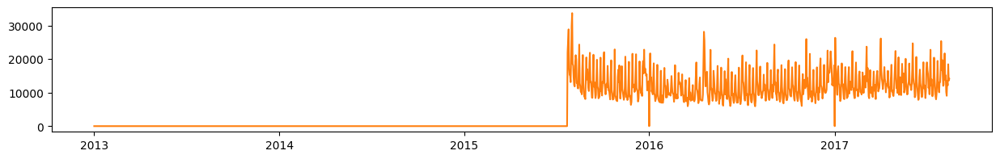

In [24]:
for city, group in store_df.groupby(['city','cluster']):
    store_numbers = list(group['store_nbr'])
    print(f"City and Cluster: {city}")
    print(f"Store Numbers: {store_numbers}")
    print("\n")
    for store in store_numbers:
        tmp_df = train_df[train_df['store_nbr'] == store][['date', 'agg_sales']].drop_duplicates()
        #mask = tmp_df['agg_sales'] != 0
        #first_non_zero_index = mask.idxmax()
        #tmp_df = tmp_df.loc[first_non_zero_index:]
        print('store_number:', store)
        plt.figure(figsize=(15, 2))
        plt.plot(tmp_df['date'], tmp_df['agg_sales'], 'C' + str(store))
        plt.show()

In [25]:
merged_df = pd.merge(train_df, store_df[['store_nbr', 'cluster']], on='store_nbr', how='left')

In [26]:
merged_df

,id,date,store_nbr,family,sales,onpromotion,agg_sales,cluster
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,0.000,13
1,1,2013-01-01,1,BABY CARE,0.000,0,0.000,13
2,2,2013-01-01,1,BEAUTY,0.000,0,0.000,13
3,3,2013-01-01,1,BEVERAGES,0.000,0,0.000,13
4,4,2013-01-01,1,BOOKS,0.000,0,0.000,13
...,...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,18636.477,6
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,18636.477,6
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,18636.477,6
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,18636.477,6


In [27]:
cluster_sales = merged_df.groupby(['date', 'cluster'])['agg_sales'].sum().reset_index()

In [28]:
cluster_sales

,date,cluster,agg_sales
0,2013-01-01,1,8.288343e+04
1,2013-01-01,2,0.000000e+00
2,2013-01-01,3,0.000000e+00
3,2013-01-01,4,0.000000e+00
4,2013-01-01,5,0.000000e+00
...,...,...,...
28623,2017-08-15,13,1.421548e+06
28624,2017-08-15,14,2.923017e+06
28625,2017-08-15,15,1.229887e+06
28626,2017-08-15,16,3.724486e+05
